In [ ]:
!nvidia-smi

Thu Aug 15 17:49:12 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P0              31W /  70W |    971MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.78 🚀 Python-3.10.12 torch-2.3.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.6/107.7 GB disk)


In [ ]:
!pip install supervision

from IPython import display
display.clear_output()

import supervision as sv
print("supervision.__version__:", sv.__version__)

supervision.__version__: 0.22.0


In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/traffic_video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
from ultralytics import YOLO

model = 'yolov8x.pt'
model = YOLO(model)
model.fuse()

100%|██████████| 131M/131M [00:01<00:00, 127MB/s]


YOLOv8x summary (fused): 268 layers, 68,200,608 parameters, 0 gradients, 257.8 GFLOPs


In [ ]:
# dict maping class_id to class_name
class_name_dict = model.model.names
print(class_name_dict) # 79 classes

{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw

In [ ]:
# class_ids of interest - car, motorcycle, bus and truck
selected_classes = [2, 3, 5, 7]

In [ ]:
import supervision as sv
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

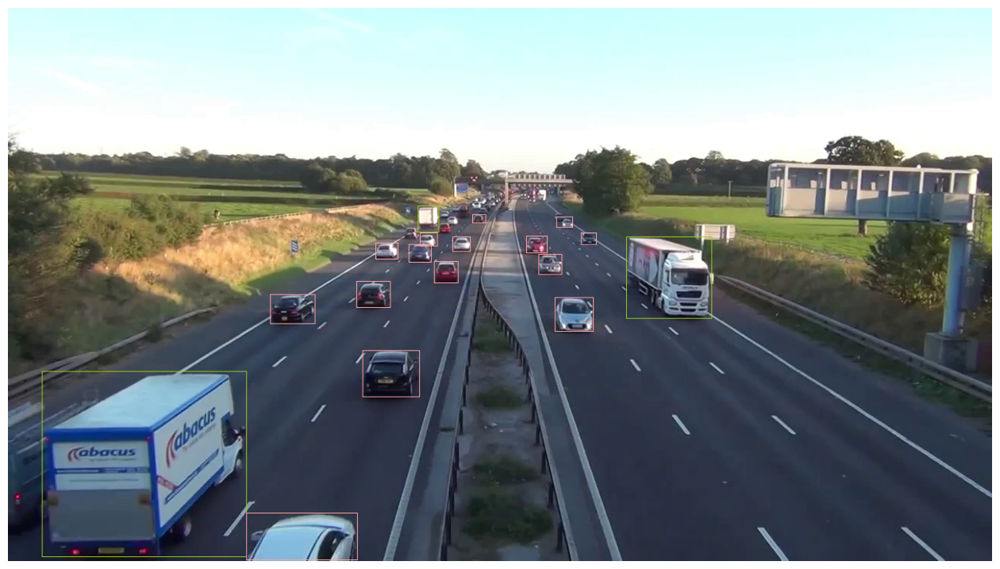

In [ ]:
video_path = '/content/traffic_video.mp4'
generator = sv.get_video_frames_generator(video_path)

box_annotator = sv.BoxAnnotator(thickness=1)

# acquire first video frame
iterator = iter(generator)
frame = next(iterator)

# model prediction on single frame and conversion to supervision Detections
results = model(frame, verbose=False)[0]

# convert to Detections
detections = sv.Detections.from_ultralytics(results)
label_annotator = sv.LabelAnnotator()
# only consider class id from selected_classes define above
detections = detections[np.isin(detections.class_id, selected_classes)]

# format custom labels
# labels = [
#     f"{class_name_dict[class_id]} {confidence:.2f}"
#     for class_id, confidence
#     in zip(detections.class_id, detections.confidence)
# ]


annotated_frame = box_annotator.annotate(
    scene=frame, detections=detections)
# annotated_frame = label_annotator.annotate(
#     scene=annotated_frame, detections=detections, labels=labels)

%matplotlib inline
sv.plot_image(annotated_frame, (16,16))

In [ ]:
import cv2

from ultralytics import YOLO, solutions


def count_specific_classes(video_path, output_video_path, model_path, classes_to_count):
    """Count specific classes of objects in a video."""
    model = YOLO(model_path)
    cap = cv2.VideoCapture(video_path)
    assert cap.isOpened(), "Error reading video file"
    w, h, fps = (int(cap.get(x)) for x in (cv2.CAP_PROP_FRAME_WIDTH, cv2.CAP_PROP_FRAME_HEIGHT, cv2.CAP_PROP_FPS))
    line_points = [(20, 400), (1080, 400)]
    video_writer = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*"mp4v"), fps, (w, h))
    counter = solutions.ObjectCounter(
        view_img=True, reg_pts=line_points, names=model.names, draw_tracks=True, line_thickness=2
    )

    while cap.isOpened():
        success, im0 = cap.read()
        if not success:
            print("Video frame is empty or video processing has been successfully completed.")
            break
        tracks = model.track(im0, persist=True, show=False, classes=classes_to_count)
        im0 = counter.start_counting(im0, tracks)
        video_writer.write(im0)

    cap.release()
    video_writer.release()
    cv2.destroyAllWindows()

count_specific_classes("/content/traffic_video.mp4", "output_specific_classes.avi", "yolov8n.pt", [2, 3, 5, 7])

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

Line Counter Initiated.

0: 384x640 5 cars, 1 bus, 159.1ms
Speed: 2.9ms preprocess, 159.1ms inference, 5.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 1 bus, 152.9ms
Speed: 3.4ms preprocess, 152.9ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 2 buss, 181.9ms
Speed: 4.4ms preprocess, 181.9ms inference, 2.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 cars, 2 buss, 248.0ms
Speed: 3.8ms preprocess, 248.0ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 cars, 2 buss, 234.0ms
Speed: 4.7ms preprocess, 234.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 cars, 2 buss, 247.2ms
Speed: 3.9ms preprocess, 247.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 cars, 2 buss, 239.0ms
Speed: 6.2ms preprocess, 239.0ms inference, 2.0ms postprocess pe

In [ ]:
from moviepy.editor import *

path="/content/output_specific_classes.avi"

clip=VideoFileClip(path)
clip.ipython_display(width=600)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
